<a href="https://colab.research.google.com/github/aliya-fatma011/Deep-Learning/blob/main/CassavaNetl_mobilee3)_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

from google.colab import drive
drive.mount('/content/drive')

import os



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
dataset_path = '/content/dataset_sir'

In [3]:
!pip install tensorflow==2.17.0
!pip install tf-models-official

  Using cached tf_models_official-2.20.0-py2.py3-none-any.whl.metadata (1.6 kB)
  Using cached tensorflow_model_optimization-0.8.0-py2.py3-none-any.whl.metadata (904 bytes)
  Using cached seqeval-1.2.2.tar.gz (43 kB)
  Preparing metadata (setup.py) ... done
  Using cached sacrebleu-2.6.0-py3-none-any.whl.metadata (39 kB)
  Using cached ai_edge_litert-2.1.4-cp312-cp312-manylinux_2_27_x86_64.whl.metadata (2.2 kB)
  Using cached tensorflow-2.20.0-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.5 kB)
  Using cached backports_strenum-1.2.8-py3-none-any.whl.metadata (3.6 kB)
  Using cached protobuf-7.34.1-cp310-abi3-manylinux2014_x86_64.whl.metadata (595 bytes)
INFO: pip is looking at multiple versions of opencv-python-headless to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 102.1 MB/s eta 0:00:

In [4]:
import tensorflow as tf

from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

In [5]:
print("Contents of /content/drive/MyDrive:")
!ls -F "/content/drive/MyDrive/"

Contents of /content/drive/MyDrive:
'10th marksheet.A.pdf'
 12.pdf
 aliya.pdf
'aliya pic.pdf'
 ap.pdf
'Centralized Student Placement Management (1)'
'Colab Notebooks'/
'compiler design df.pdf'
'Copy of f back (1).pdf'
'Copy of f back.pdf'
'Dataset of groundnut plant leaf images for classification and detection'/
 DOC-20260214-WA0010..pdf
'DocScanner 18 Dec 2025 21-06 (1).pdf'
'f back (1).pdf'
'f back.pdf'
 main_dataset/
 noc.pdf
'papa death certificate.pdf'
'payment recipt 3rd sem.pdf'
 photo.pdf
'resume A.pdf'
 Scanned_20260409-1418.pdf
'Sem 5'@
'Sem 6'@


In [6]:
print("Contents of /content/:")
!ls -F "/content/"

Contents of /content/:
drive/	sample_data/


In [7]:
import pandas as pd

In [8]:
MAIN_DATASET_PATH = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset'

TRAIN_CSV = MAIN_DATASET_PATH + "/Train/Train.csv"
TRAIN_DIR = MAIN_DATASET_PATH + "/Train/Train_Images_clean"

TEST_CSV = MAIN_DATASET_PATH + "/Test/Test.csv"
TEST_DIR = MAIN_DATASET_PATH + "/Test/Test_Images_clean"

LABEL_JSON = MAIN_DATASET_PATH + "/label_num_to_disease_map.json"

In [9]:
import os

print(os.path.exists(TRAIN_CSV))
print(os.path.exists(TEST_CSV))
print(os.path.exists(TRAIN_DIR))
print(os.path.exists(TEST_DIR))
print(os.path.exists(LABEL_JSON))

True
True
True
True
True


In [10]:
# =========================================================
# 6. LOAD DATASET
# =========================================================

import json

# --- Diagnostic Step: List contents of main_dataset directory ---
print(f"Contents of {MAIN_DATASET_PATH}:")
!ls -F "{MAIN_DATASET_PATH}"
# ----------------------------------------------------------------

train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print('Train Shape :', train_df.shape)
print('Test Shape  :', test_df.shape)

Contents of /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset:
label_num_to_disease_map.json  Test/  Train/
Train Shape : (4000, 2)
Test Shape  : (1000, 2)


In [11]:
df = pd.read_csv(TRAIN_CSV)

In [12]:
import os

print("Contents of /content/ (recursive listing):")

# This might produce a lot of output, consider running with !ls -R /content/ if you want to see all
# For a more manageable output, let's just check the top-level directories within /content

for root, dirs, files in os.walk('/content/', topdown=True):
    # Limit depth to avoid excessive output, e.g., only show up to 2 levels deep
    depth = root.count(os.sep) - '/content/'.count(os.sep)
    if depth < 3:
        indent = '    ' * depth
        print(f"{indent}{os.path.basename(root)}/")
        for f in files:
            print(f"{indent}    {f}")

        # If you expect the dataset in a specific subfolder, you can uncomment and adjust this:
        # if 'dataset_sir' in dirs:
        #     print(f"{indent}    Found 'dataset_sir' in {root}")
        #     break # Stop after finding the desired directory


Contents of /content/ (recursive listing):
/
.config/
    hidden_gcloud_config_universe_descriptor_data_cache_configs.db
    config_sentinel
    gce
    active_config
    .last_survey_prompt.yaml
    .last_update_check.json
    default_configs.db
    .last_opt_in_prompt.yaml
    configurations/
        config_default
    logs/
        2026.05.06/
            13.32.05.421505.log
            13.31.36.511193.log
            13.32.18.938562.log
            13.31.54.722770.log
            13.32.07.046356.log
            13.32.19.730257.log
drive/
    MyDrive/
        12.pdf
        Sem 5
        Sem 6
        10th marksheet.A.pdf
        photo.pdf
        aliya pic.pdf
        aliya.pdf
        ap.pdf
        f back (1).pdf
        f back.pdf
        Copy of f back (1).pdf
        Copy of f back.pdf
        DocScanner 18 Dec 2025 21-06 (1).pdf
        resume A.pdf
        payment recipt 3rd sem.pdf
        Centralized Student Placement Management (1)
        papa death certificate.pdf
     

#Counts the Total Numbers of Labels

In [13]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Counts Total numbers of Taining and Test Images

In [14]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#label mapping

In [15]:
import json

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


Convert labels → actual names

In [16]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")



Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


In [17]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [18]:
print("Train Class Distribution (from DataFrame):")
counts_from_df = train_df["Labels"].value_counts().sort_index()
for label, count in counts_from_df.items():
    print(f"{label_map[str(label)]} → {count}")

Train Class Distribution (from DataFrame):
CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [19]:
import os

# Correct folders
train_dir = TRAIN_DIR

test_dir = TEST_DIR


# Function to count images
def count_images(folder):

    total = 0

    for root, dirs, files in os.walk(folder):

        images = [
            f for f in files
            if f.lower().endswith(
                ('.png', '.jpg', '.jpeg')
            )
        ]

        total += len(images)

    return total


# Print counts
print("✅ Total Train Clean Images:",
      count_images(train_dir))

print("✅ Total Test Clean Images:",
      count_images(test_dir))

✅ Total Train Clean Images: 4000
✅ Total Test Clean Images: 1000


#Plotting the Barplot to see all the class image

In [20]:
counts = df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

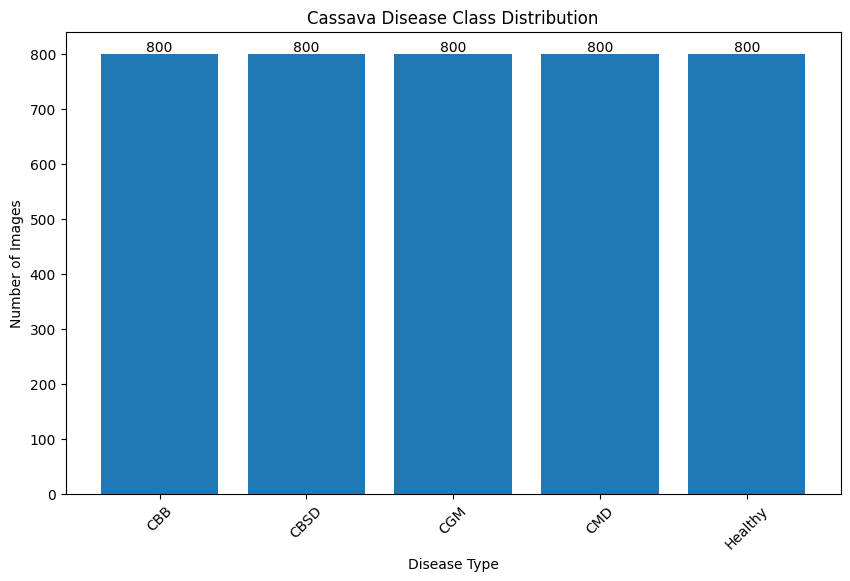

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

plt.bar(names, values)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

# Add values on top
for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

#Function to Access the single images

In [22]:
print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)

[3 0 2 4 1]
int64


In [23]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    # Filter the DataFrame using the integer class_id
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    # Construct the image path directly using TRAIN_DIR and the image ID
    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

In [24]:
import os

print(f"Contents of TRAIN_DIR ({TRAIN_DIR}):")
# List only the first 10 items to avoid overwhelming output
contents = os.listdir(TRAIN_DIR)
if contents:
    for item in contents[:10]:
        print(item)
else:
    print("TRAIN_DIR is empty or does not exist.")

Contents of TRAIN_DIR (/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train_Images_clean):
3784315903.jpg
3863066565.jpg
3854923530.jpg
3826378692.jpg
3837192356.jpg
385812035.jpg
3852514218.jpg
3841961758.jpg
3813620418.jpg
379958464.jpg


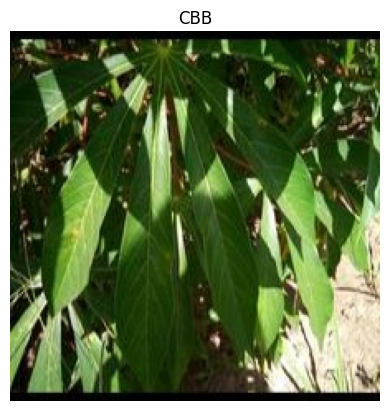

In [25]:
show_one_image(0)

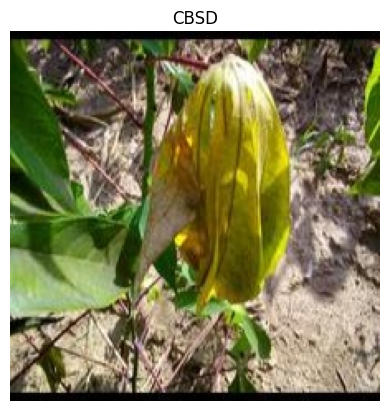

In [26]:
show_one_image(1)   # change class id

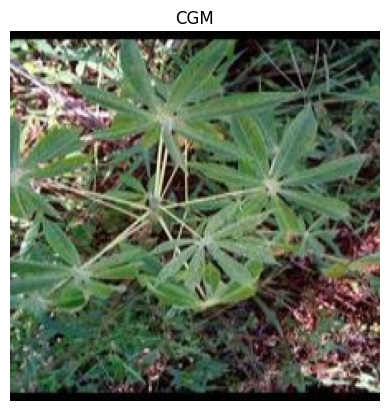

In [27]:
show_one_image(2)   # change class id

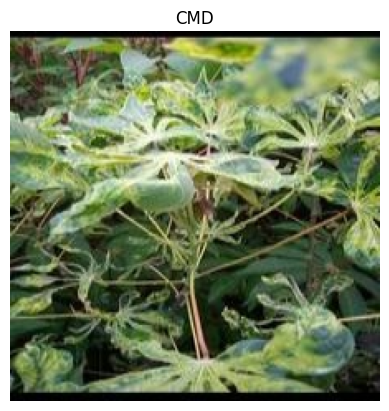

In [28]:
show_one_image(3)   # change class id

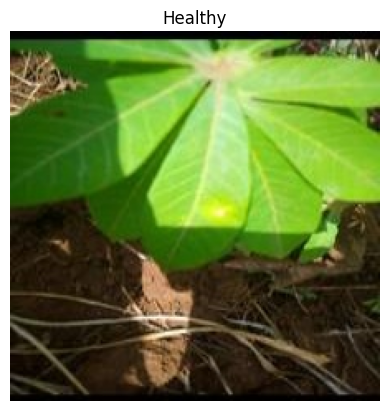

In [29]:
show_one_image(4)   # change class id

In [30]:
import cv2
import os

#Function to Access 3 random images from EACH class

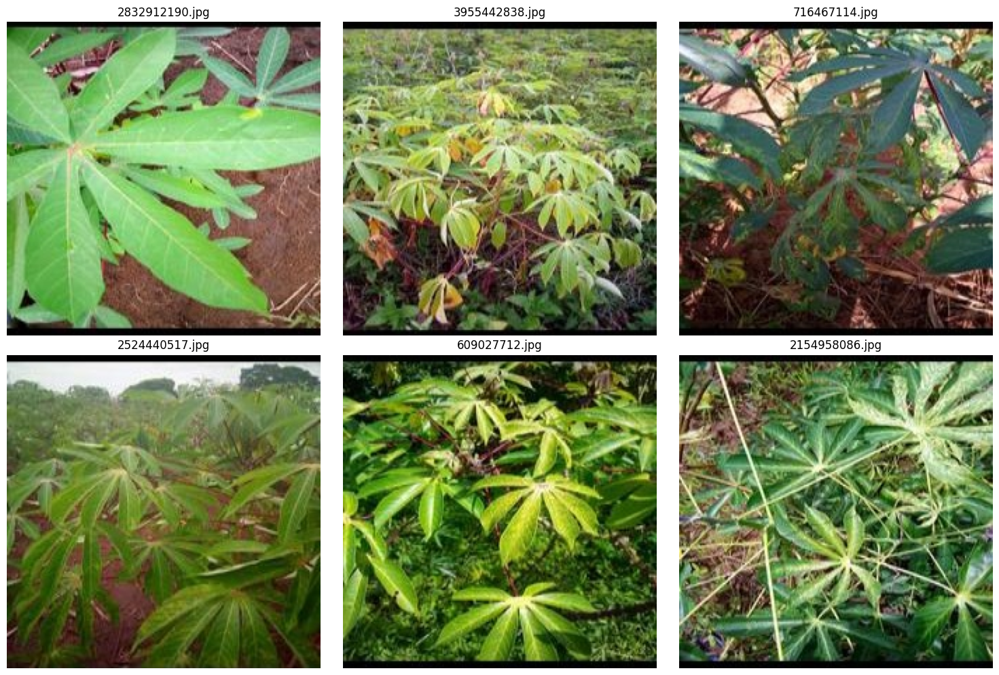

In [31]:
import matplotlib.pyplot as plt
import os
import cv2
import random

# Folder containing processed images
folder = TRAIN_DIR # Changed from "/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean" to TRAIN_DIR

# Get image files
files = [f for f in os.listdir(folder)
         if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 6 images
sample_files = random.sample(files, 6)

# Plot images
plt.figure(figsize=(15,10))

for i, file in enumerate(sample_files):

    img_path = os.path.join(folder, file)

    img = cv2.imread(img_path)

    # Convert BGR → RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(file)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image preprocessing

In [32]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Applying image preprocessing on CMD Disease of first image

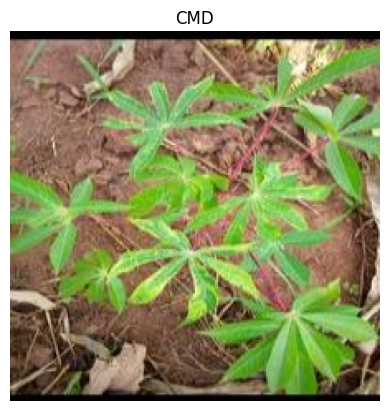

In [33]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[3]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

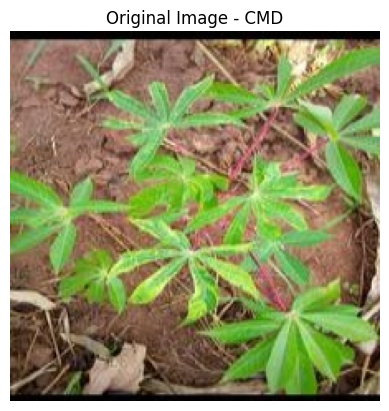

In [34]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Resize Image

In [35]:
def show_image(title, image, cmap=None):
    plt.figure(figsize=(5,5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

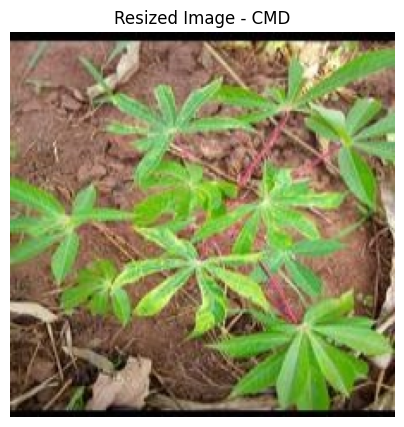

In [36]:
resized = cv2.resize(img, (224, 224))
show_image(f"Resized Image - {label_name}", resized)

Grayscale

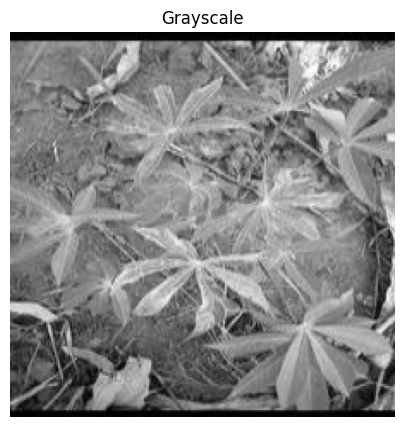

In [37]:
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
show_image("Grayscale", gray, cmap="gray")



Gaussian BLur

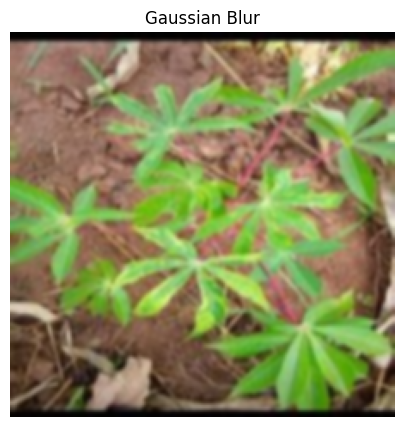

In [38]:
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)
show_image("Gaussian Blur", gaussian_blur)

Median Blur

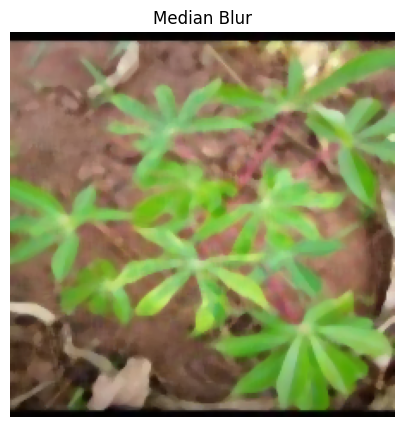

In [39]:
median_blur = cv2.medianBlur(resized, 5)
show_image("Median Blur", median_blur)

Sharpening

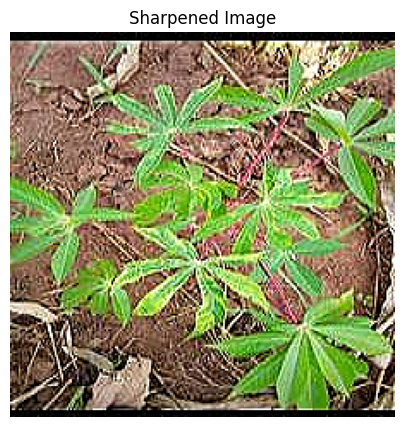

In [40]:
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(resized, -1, sharpen_kernel)
show_image("Sharpened Image", sharpened)

Histogram Equilization

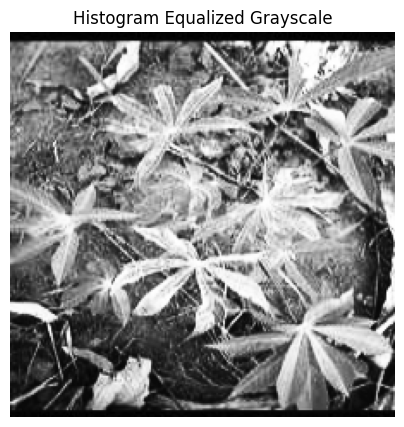

In [41]:
gray_equalized = cv2.equalizeHist(gray)
show_image("Histogram Equalized Grayscale", gray_equalized, cmap="gray")

CLAHE enhancement

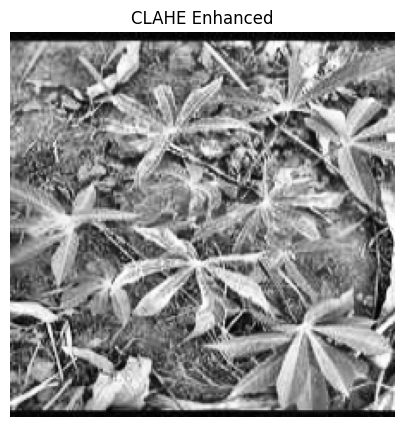

In [42]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

show_image("CLAHE Enhanced", clahe_img, cmap="gray")

Canny edge detection

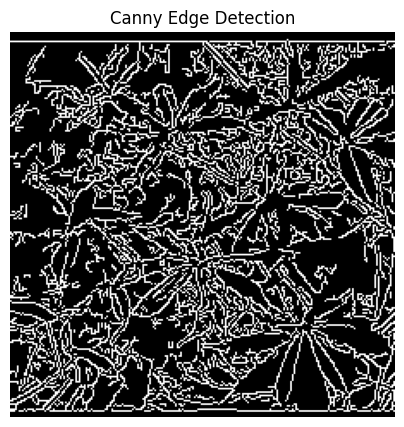

In [43]:
edges = cv2.Canny(gray, 100, 200)
show_image("Canny Edge Detection", edges, cmap="gray")

Sobel edge detection

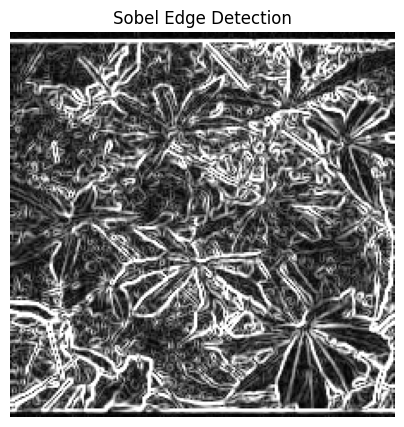

In [44]:
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

show_image("Sobel Edge Detection", sobel, cmap="gray")




Thresholding

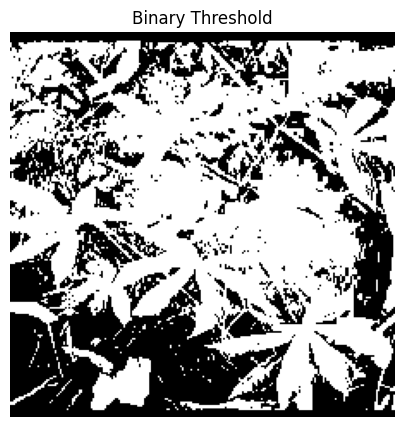

In [45]:
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
show_image("Binary Threshold", threshold, cmap="gray")

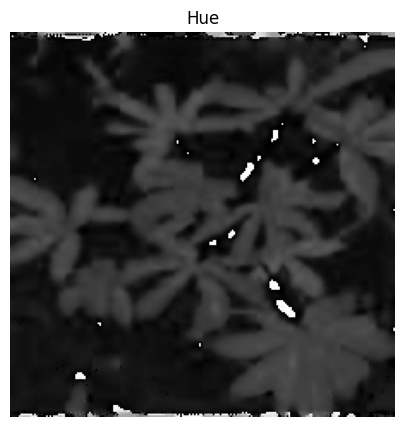

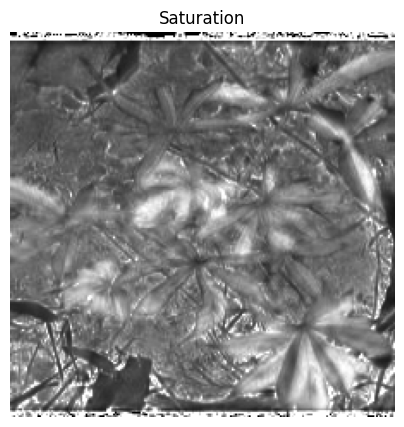

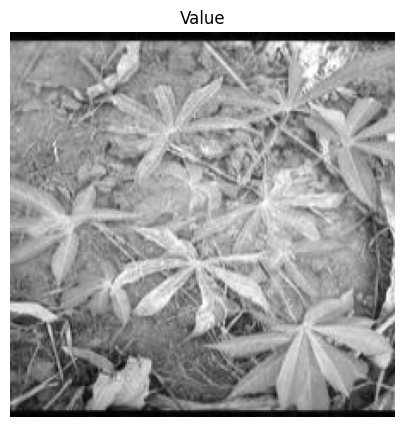

In [46]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

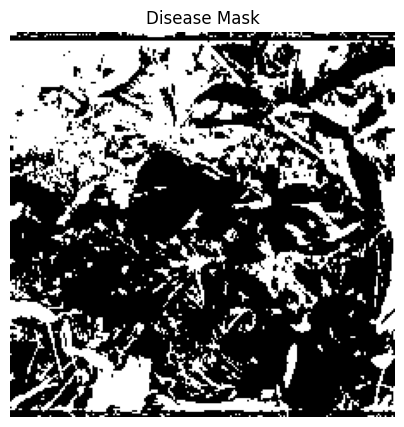

In [47]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

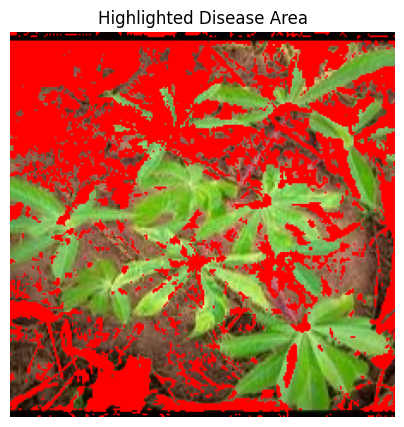

In [48]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

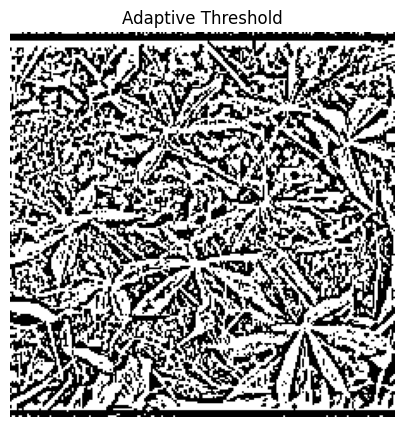

In [49]:
adaptive_threshold = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

show_image("Adaptive Threshold", adaptive_threshold, cmap="gray")

Morphological operations

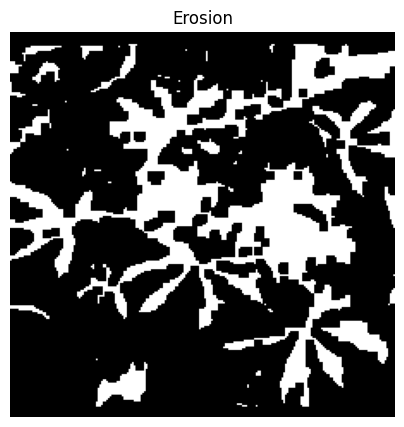

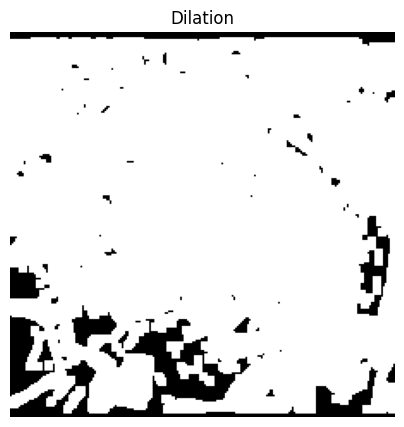

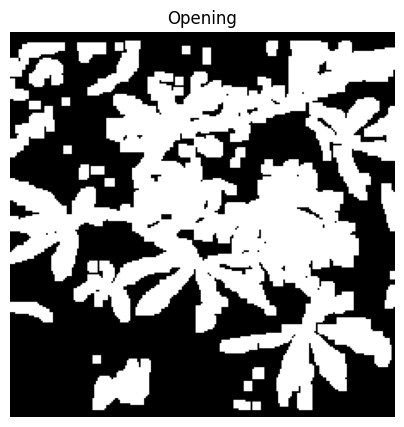

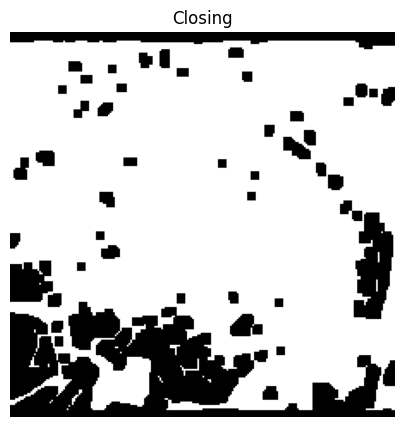

In [50]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

HSV color space

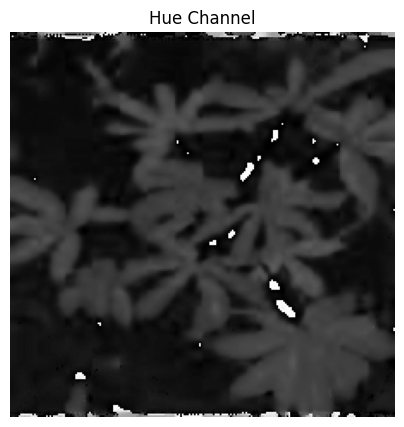

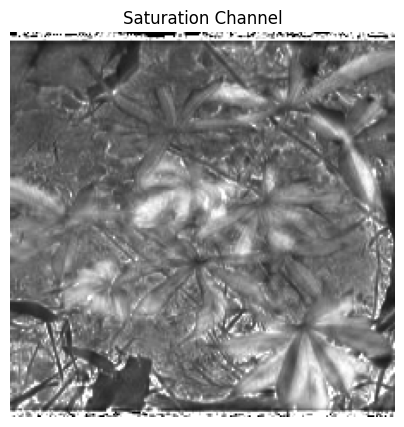

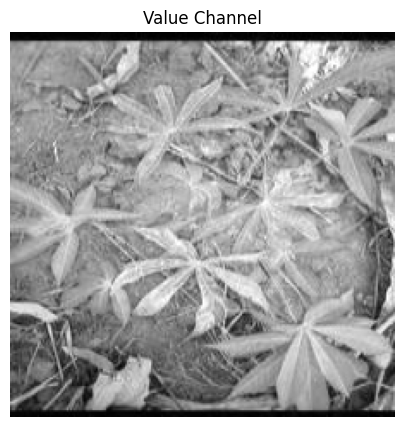

In [51]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv)

show_image("Hue Channel", h, cmap="gray")
show_image("Saturation Channel", s, cmap="gray")
show_image("Value Channel", v, cmap="gray")

RGB histogram

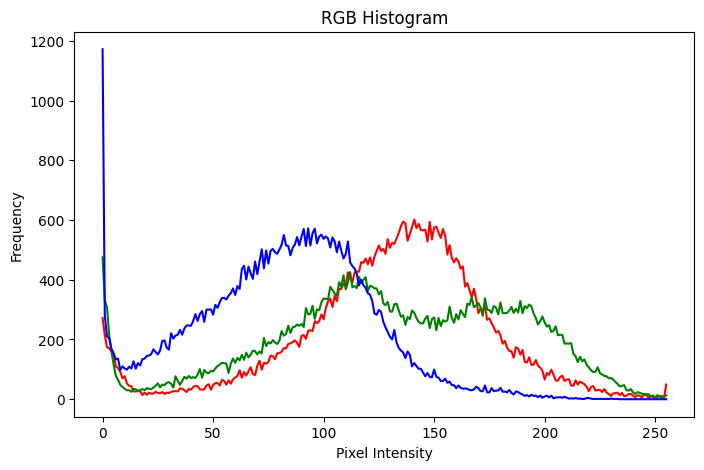

In [52]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Show everything in one grid

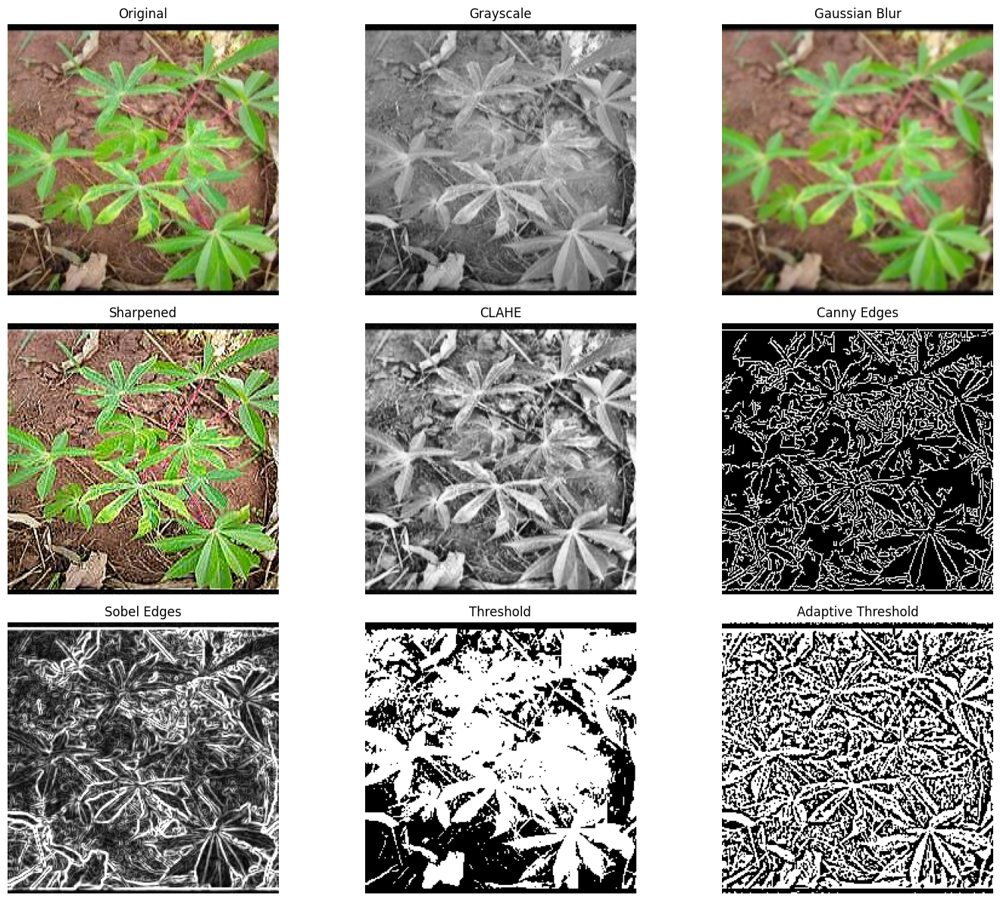

In [53]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [54]:
import os
import json
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import cv2
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score
)

import tensorflow as tf

from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

from tensorflow.keras.models import Model

from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization,
    Input
)

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal

In [55]:
print("TensorFlow Version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow Version: 2.20.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [56]:
SEED = 42

np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

In [57]:
TRAIN_CSV = "/content/train.csv"

TEST_CSV = "/content/test.csv"

In [59]:
TRAIN_CSV = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train.csv'
TEST_CSV = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Test/Test.csv'

train_df = pd.read_csv(TRAIN_CSV)

test_df = pd.read_csv(TEST_CSV)

print(train_df.head())

               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4
               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4


In [60]:
train_df = pd.read_csv(TRAIN_CSV)

test_df = pd.read_csv(TEST_CSV)

print(train_df.head())

               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4


In [61]:
train_data, valid_data = train_test_split(

    train_df,

    test_size=0.20,

    stratify=train_df['Labels'],

    random_state=SEED
)

print("Train:", len(train_data))

print("Validation:", len(valid_data))

print("Test:", len(test_df))

Train: 3200
Validation: 800
Test: 1000


In [62]:
IMG_SIZE = 224

BATCH_SIZE = 64

EPOCHS_HEAD = 15

EPOCHS_FINE = 15

LEARNING_RATE_HEAD = 1e-3

LEARNING_RATE_FINE = 1e-5

In [63]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,

    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [65]:
train_df['Labels'] = train_df['Labels'].astype(str)
valid_data['Labels'] = valid_data['Labels'].astype(str)

In [66]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='ID',
    y_col='Labels',
    directory=TRAIN_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

Found 4000 validated image filenames belonging to 5 classes.


In [68]:
valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_data,
    x_col='ID',
    y_col='Labels',
    directory=TRAIN_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 800 validated image filenames belonging to 5 classes.


In [69]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [70]:
test_generator = test_datagen.flow_from_dataframe(

    dataframe=test_df,

    x_col='ID',

    directory=TEST_DIR,

    target_size=(IMG_SIZE, IMG_SIZE),

    batch_size=BATCH_SIZE,

    class_mode=None,

    shuffle=False
)

Found 1000 validated image filenames.


In [72]:
base_model = MobileNetV3Small(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,
    weights='imagenet'
)

4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [73]:
base_model.trainable = False

In [75]:
NUM_CLASSES = num_classes # Re-define NUM_CLASSES using the existing num_classes variable

inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_model(inputs, training=False)

x = GlobalAveragePooling2D()(x)

x = BatchNormalization()(x)

x = Dropout(0.4)(x)

x = Dense(
    256,
    activation='relu',
    kernel_initializer=HeNormal(),
    kernel_regularizer=l2(0.001)
)(x)

x = BatchNormalization()(x)

x = Dropout(0.3)(x)

outputs = Dense(
    NUM_CLASSES,
    activation='softmax'
)(x)

model = Model(inputs, outputs)

In [76]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Small (Functional)   │ (None, 7, 7, 576)      │       939,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 576)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 576)            │         2,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 576)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       147,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,091,445 (4.16 MB)

 Trainable params: 150,661 (588.52 KB)

 Non-trainable params: 940,784 (3.59 MB)

In [77]:
callbacks = [

    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    ),

    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=2,
        verbose=1,
        min_lr=1e-7
    ),

    ModelCheckpoint(
        'best_mobilenetv3small.keras',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

In [78]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=LEARNING_RATE_HEAD
    ),

    loss=tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.1
    ),

    metrics=['accuracy']
)

In [79]:
history_head = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=EPOCHS_HEAD,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.2940 - loss: 2.6761 
Epoch 1: val_accuracy improved from None to 0.47625, saving model to best_mobilenetv3small.keras

Epoch 1: finished saving model to best_mobilenetv3small.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 1093s 17s/step - accuracy: 0.3483 - loss: 2.4637 - val_accuracy: 0.4762 - val_loss: 1.8419 - learning_rate: 0.0010
Epoch 2/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4275 - loss: 2.1185
Epoch 2: val_accuracy improved from 0.47625 to 0.53875, saving model to best_mobilenetv3small.keras

Epoch 2: finished saving model to best_mobilenetv3small.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4335 - loss: 2.0929 - val_accuracy: 0.5387 - val_loss: 1.7417 - learning_rate: 0.0010
Epoch 3/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4818 - loss: 1.9506
Epoch 3: val_accuracy improved from 0.53875 to 0.56875, saving model to best_mobilenetv3small.keras

Epoch 3: finished saving model to best_mobil

In [80]:
base_model.trainable = True

In [81]:
for layer in base_model.layers[:-30]:
    layer.trainable = False

In [82]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=LEARNING_RATE_FINE
    ),

    loss=tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.1
    ),

    metrics=['accuracy']
)

In [83]:
history_fine = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=EPOCHS_FINE,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5242 - loss: 1.5531
Epoch 1: val_accuracy did not improve from 0.64750
63/63 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.5288 - loss: 1.5564 - val_accuracy: 0.5938 - val_loss: 1.4352 - learning_rate: 1.0000e-05
Epoch 2/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5231 - loss: 1.5703
Epoch 2: ReduceLROnPlateau reducing learning rate to 1.9999999494757505e-06.

Epoch 2: val_accuracy did not improve from 0.64750
63/63 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.5282 - loss: 1.5574 - val_accuracy: 0.5387 - val_loss: 1.5416 - learning_rate: 1.0000e-05
Epoch 3/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5399 - loss: 1.5269
Epoch 3: val_accuracy did not improve from 0.64750
63/63 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.5493 - loss: 1.5295 - val_accuracy: 0.5013 - val_loss: 1.6244 - learning_rate: 2.0000e-06
Epoch 4/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5539 - loss: 1.5321
Epoch 4